In [25]:
import AFQ.data as afqd
import AFQ.viz.utils as plot_utils
import afqinsight as afqi
import json
import matplotlib.pyplot as plt
import numpy as np
import os.path as op
import pandas as pd
import pickle
import seaborn as sns

from matplotlib.gridspec import  GridSpec
from matplotlib.legend_handler import HandlerTuple
from plot_formatting import set_size
from plot_utils import plot_coefs_on_bundle_cores
from sklearn.metrics import accuracy_score, r2_score, median_absolute_error, roc_auc_score
from string import Template
from textwrap import wrap


plt.style.use('tex')
fig_dir = "../reports/paper_figures"
latex_output_file = "../reports/manuscript/output.tex"

COLUMN_WIDTH = 246.0  # in points
FULL_TEXT_WIDTH = 510.0  # in points
FULL_TEXT_LENGTH = 660.0  # in points

In [26]:
with open("als_classify_paper.pkl", "rb") as fp:
    als_results = pickle.load(fp)
    
with open("age_regression.pkl", "rb") as fp:
    age_results = pickle.load(fp)

with open("hbn_regression_paper.pkl", "rb") as fp:
    hbn_results = pickle.load(fp)
    
with open("camcan_regression_paper.pkl", "rb") as fp:
    cc_results = pickle.load(fp)

In [27]:
def get_l1_ratios(results, key):
    try:
        l1_ratios = [res["l1_ratio"] for res in results[key][0].values()]
    except KeyError:
        estimators = [cv_res["pipeline"].named_steps["estimate"]
                      for cv_res in results[key][0].values()]

        if hasattr(estimators[0], "estimators_"):
            l1_ratios = [
                [est.l1_ratio_ for est in cv_est.estimators_]
                for cv_est in estimators
            ]
        elif hasattr(estimators[0], "regressor_"):
            l1_ratios = [
                [est.l1_ratio_ for est in cv_est.regressor_.estimators_]
                for cv_est in estimators
            ]

    return np.array(l1_ratios)

In [28]:
als_l1_ratios = get_l1_ratios(als_results, "bagging_stratify_trim0")
age_l1_ratios = get_l1_ratios(age_results, "bagging_target_transform")
hbn_l1_ratios = get_l1_ratios(hbn_results, "bagging_target_transform_trim0")
cc_l1_ratios = get_l1_ratios(cc_results, "bagging_target_transform_trim0")

In [29]:
print(f"ALS:     {np.mean(als_l1_ratios):4.2f} ({np.std(als_l1_ratios):4.2f})")
print(f"WH:      {np.mean(age_l1_ratios):4.2f} ({np.std(age_l1_ratios):4.2f})")
print(f"HBN:     {np.mean(hbn_l1_ratios):4.2f} ({np.std(hbn_l1_ratios):4.2f})")
print(f"Cam-CAN: {np.mean(age_l1_ratios):4.2f} ({np.std(age_l1_ratios):4.2f})")

ALS:     0.21 (0.31)
WH:      0.84 (0.21)
HBN:     0.72 (0.14)
Cam-CAN: 0.84 (0.21)


In [30]:
# Create a template with $KEY and $VALUE as the placeholders
# The $$ is to escape the dollar sign
latex_number_template = Template("\\newcommand*{\$KEY}{$$${VALUE}$$}\n")

with open(latex_output_file, "w") as fp:
    fp.write(latex_number_template.substitute(KEY="alsLRatio", VALUE=round(np.mean(als_l1_ratios), 2)))
    fp.write(latex_number_template.substitute(KEY="whLRatio", VALUE=round(np.mean(age_l1_ratios), 2)))
    fp.write(latex_number_template.substitute(KEY="hbnLRatio", VALUE=round(np.mean(hbn_l1_ratios), 2)))
    fp.write(latex_number_template.substitute(KEY="ccLRatio", VALUE=round(np.mean(cc_l1_ratios), 2)))

In [31]:
df_bag = {}
beta_hats = {}
plotly_figs = {}

# ALS classification on Sarica data

In [32]:
X, y, groups, columns, subjects, classes = afqi.load_afq_data(
    "../data/raw/als_data",
    target_cols=["class"],
    label_encode_cols=["class"],
)

label_sets = afqi.multicol2sets(pd.MultiIndex.from_tuples(columns, names=["metric", "tractID", "nodeID"]))
pyafq_bundles = [
    c for c in columns
    if c[1] not in ["Right Cingulum Hippocampus", "Left Cingulum Hippocampus"]
]
pyafq_bundles = [
    [c] for c in np.unique([col[1] for col in pyafq_bundles])
]
X_pyafq_bundles = afqi.select_groups(
    X,
    pyafq_bundles,
    label_sets
)

columns = [
    c for c in columns 
    if c[1] not in ["Right Cingulum Hippocampus", "Left Cingulum Hippocampus"]
]
label_sets = afqi.multicol2sets(pd.MultiIndex.from_tuples(columns, names=["metric", "tractID", "nodeID"]))

X_md_fa = afqi.select_groups(
    X_pyafq_bundles,
    [["fa"], ["md"]],
    label_sets
)

columns_md_fa = [
    c for c in columns
    if "fa" in c or "md" in c
]

groups_md_fa = groups[:36]

INFO:AFQ.viz:Loading Volume...


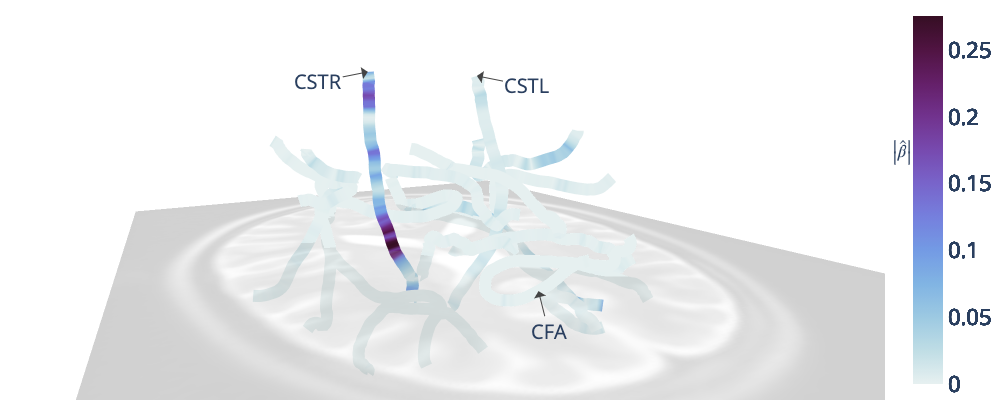

In [33]:
_beta_hats, _fig = plot_coefs_on_bundle_cores(
    als_results,
    key="bagging_stratify_trim0",
    columns=columns_md_fa,
    linewidth=24,
    coef_func=("abs",),
    eye=dict(x=0.475, y=0.855, z=0.19),
    center=dict(x=0, y=0, z=0),
    width=500, height=400,
)

beta_hats["sarica"] = _beta_hats
plotly_figs["sarica"] = _fig

_fig.show()

In [34]:
coefs_img_fname = op.join(fig_dir, "als_coefs.pdf")
_fig.write_image(coefs_img_fname)
coefs_img_fname = op.join(fig_dir, "als_coefs.png")
_fig.write_image(coefs_img_fname, scale=2)

In [35]:
als_bagging_results = als_results["bagging_stratify_trim0"][0]
df_bag["sarica"] = pd.concat([
    pd.DataFrame.from_dict(
        {
            k: v for k, v in bag_res.items()
            if k in ["test_idx", "y_prob", "y_true"]
        }
    ).set_index(keys="test_idx", drop=True)
    for bag_res in als_bagging_results.values()
]).sort_index()
df_bag["sarica"]["Ground truth"] = df_bag["sarica"]["y_true"].map({0: "Control", 1: "ALS"})
df_bag["sarica"]["y_pred"] = (df_bag["sarica"]["y_prob"] > 0.5).astype(int)
df_bag["sarica"]["Prediction"] = df_bag["sarica"]["y_pred"].map(
    {0: "Predicted control", 1: "Predicted ALS"}
)

In [36]:
als_accuracy = accuracy_score(df_bag["sarica"]["y_true"], df_bag["sarica"]["y_pred"])
als_roc_auc = roc_auc_score(df_bag["sarica"]["y_true"], df_bag["sarica"]["y_prob"])

with open(latex_output_file, "a") as fp:
    fp.write(latex_number_template.substitute(KEY="alsAccuracy", VALUE=int(100*round(als_accuracy, 2))))
    fp.write(latex_number_template.substitute(KEY="alsRocAuc", VALUE=round(als_roc_auc, 2)))

In [37]:
df_bag["sarica"]

,y_prob,y_true,Ground truth,y_pred,Prediction
test_idx,,,,,
0,0.108239,0,Control,0,Predicted control
1,0.130566,0,Control,0,Predicted control
2,0.446050,0,Control,0,Predicted control
3,0.365667,0,Control,0,Predicted control
4,0.229388,0,Control,0,Predicted control
5,0.755206,0,Control,1,Predicted ALS
6,0.148313,0,Control,0,Predicted control
7,0.480387,0,Control,0,Predicted control
8,0.208695,0,Control,0,Predicted control


In [38]:
subjects = pd.read_csv("../data/raw/als_data/subjects.csv")
nodes = pd.read_csv("../data/raw/als_data/nodes.csv")
merged = pd.merge(nodes, subjects, on="subjectID")
stats = nodes.columns.drop(["subjectID", "tractID", "nodeID"])
stat = merged[["nodeID", "tractID", "fa", "class"]]
tract_names = ["Right Corticospinal",]
tract_stats = {}
for tid in tract_names:
    tract_stats[tid] = stat[stat["tractID"] == tid].drop("tractID", axis="columns")

In [39]:
false_pos_sub_ids = [5, 16, 19]
false_neg_sub_ids = [26, 30, 32, 35, 36]

false_pos_subs = {
    sid: merged[
        merged["subjectID"] == "subject_{sid:03d}".format(sid=sid)
    ][["nodeID", "tractID", "fa", "class"]]
    for sid in false_pos_sub_ids
}

false_neg_subs = {
    sid: merged[
        merged["subjectID"] == "subject_{sid:03d}".format(sid=sid)
    ][["nodeID", "tractID", "fa", "class"]]
    for sid in false_neg_sub_ids    
}

for sid in false_pos_subs.keys():
    false_pos_subs[sid] = false_pos_subs[sid][false_pos_subs[sid]["tractID"] == tract_names[0]]
    
for sid in false_neg_subs.keys():
    false_neg_subs[sid] = false_neg_subs[sid][false_neg_subs[sid]["tractID"] == tract_names[0]]

In [40]:
cmap_tab10 = plt.get_cmap("tab10").colors

<ipython-input-41-64a2b5e053d8>:201: UserWarning:

constrained_layout not applied.  At least one axes collapsed to zero width or height.

/Users/richford/miniconda3/envs/afq-insight-paper/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning:

constrained_layout not applied.  At least one axes collapsed to zero width or height.



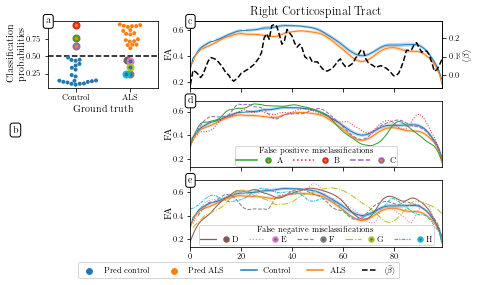

In [41]:
figsize = set_size(width=FULL_TEXT_WIDTH, subplots=(3, 3))
fig = plt.figure(constrained_layout=True, figsize=(figsize[0], figsize[1]*0.95))
gs = GridSpec(3, 3, figure=fig, wspace=0.3)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1:, 0])
ax2 = fig.add_subplot(gs[0, 1:])
ax3 = fig.add_subplot(gs[1, 1:], sharex=ax2)
ax4 = fig.add_subplot(gs[2, 1:], sharex=ax2)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax3.get_xticklabels(), visible=False)

### ax0: classification probabilities
_ = sns.swarmplot(
    y="y_prob",
    x="Ground truth",
    hue="Prediction",
    data=df_bag["sarica"],
    ax=ax0,
    s=4,
    palette=cmap_tab10,
)

for sub_id, color, label in zip(false_pos_sub_ids, cmap_tab10[2:5], "ABC"):
    ax0.plot(0, df_bag["sarica"]["y_prob"][sub_id],
             marker="o", markersize=6, ls="",
             mec=color, mew=2, mfc=cmap_tab10[1],
             zorder=200, label=label)
    
for xloc, sub_id, color, label in zip([0.932, 1.0, 1.0, 1.0, 0.923], false_neg_sub_ids, cmap_tab10[5:], "DEFGH"):
    ax0.plot(xloc, df_bag["sarica"]["y_prob"][sub_id],
             marker="o", markersize=6, ls="",
             mec=color, mew=2, mfc=cmap_tab10[0],
             zorder=200, label=label)
    
_ = ax0.set_ylabel("Classification\nprobabilities", labelpad=-0.1)
_ = ax0.set_xlabel("Ground truth")
handles, labels = ax0.get_legend_handles_labels()
labels = [l.replace("Predicted", "Pred") for l in labels]
labels = ["\n".join(wrap(l, 20)) for l in labels]

misclass_handles = handles[:-2]
handles = handles[-2:]
labels = labels[-2:]

_ = ax0.axhline(0.5, ls="--", color="black")
_ = ax0.get_legend().remove()


### ax1: classification coefs plotted on anatomical bundles
_ = ax1.axis('off')


### ax2: plot the beta coefs and mean tract profiles
df_stat = tract_stats[tract_names[0]]
title = tract_names[0]

sns.lineplot(
    x="nodeID", y="fa", hue="class", data=df_stat,
    ci=68.2, palette=cmap_tab10[0:2],
    hue_order=["CTRL", "ALS"],
    ax=ax2,
    linewidth=1.0
)

_ = ax2.set_xlabel("% distance along fiber bundle")
_ = ax2.set_ylabel("FA", labelpad=-0.1)
_ = ax2.get_legend().remove()
_ = ax2.set_xlim(0, 99)
    
# box = ax2.get_position()
# ax2.set_position([box.x0, box.y0 + box.height * 0.1,
#                   box.width, box.height * 0.9])

ax2_twin = ax2.twinx()
beta_line = ax2_twin.plot(beta_hats["sarica"][title]["fa"], linestyle="--", color="black")
_ = ax2_twin.set_ylabel(r"$\langle \widehat{\beta} \rangle$", labelpad=-0.1)
# _ = ax2_twin.tick_params(axis='both', which='major')
_ = ax2_twin.set_xlabel("% distance along fiber bundle")

_ = ax2.set_title(tract_names[0] + " Tract")

_handles, _labels = ax2.get_legend_handles_labels()
_handles = _handles + beta_line
_labels = ["Control",
           "ALS",
           r"$\langle \widehat{\beta} \rangle$"]

handles += _handles
labels += _labels

for ax in [ax3, ax4]:
    sns.lineplot(
        x="nodeID", y="fa", hue="class", data=df_stat,
        ci=68.2, palette=cmap_tab10[0:2],
        hue_order=["CTRL", "ALS"],
        ax=ax,
        linewidth=1.0
    )
    ax.set_xlim(0, 99)

linestyles = ["solid", "dotted", "dashed", "dashdot", (0, (3, 1, 1, 1))]
for (sid, sub), ls, color, label in zip(false_pos_subs.items(), linestyles, cmap_tab10[2:5], "ABC"):
    _ = ax3.plot(sub["nodeID"], sub["fa"],
                 linewidth=1, linestyle=ls,
                 color=color, label=label)

for (sid, sub), ls, color, label in zip(false_neg_subs.items(), linestyles, cmap_tab10[5:], "DEFGH"):
    _ = ax4.plot(sub["nodeID"], sub["fa"],
                 linewidth=1, linestyle=ls,
                 color=color, label=label)

for ax in [ax3, ax4]:
    _ = ax.get_legend().remove()
    _ = ax.set_xlabel("% distance along fiber bundle")
    _ = ax.set_ylabel("FA", labelpad=-0.1)

_handles, _labels = ax3.get_legend_handles_labels()
handles += [(h0, h1) for h0, h1 in zip(_handles[2:], misclass_handles[:3])]
labels += _labels[2:]

_handles, _labels = ax4.get_legend_handles_labels()
handles += [(h0, h1) for h0, h1 in zip(_handles[2:], misclass_handles[3:])]
labels += _labels[2:]

leg = plt.figlegend(
    handles[:5], labels[:5],
    bbox_to_anchor=(0.5, 0.075),
    markerscale=0.75,
    loc="upper center",
    ncol=5,
    borderaxespad=0.0,
    handler_map={tuple: HandlerTuple(ndivide=None)},
)

leg = ax3.legend(
    handles[5:8], labels[5:8],
    markerscale=0.75,
    handler_map={tuple: HandlerTuple(ndivide=None)},
    ncol=3,
    title="False positive misclassifications",
    title_fontsize=8,
    handlelength=5.25,
    handletextpad=-0.2,
    columnspacing=1.25,
    borderaxespad=0.2,
    borderpad=0.15,
    labelspacing=0.2,
    loc="lower center",
)

# set the linewidth of each legend object
for legobj in leg.legendHandles:
    legobj.set_linewidth(1.5)

leg = ax4.legend(
    handles[8:], labels[8:],
    markerscale=0.75,
    handler_map={tuple: HandlerTuple(ndivide=None)},
    ncol=5,
    title="False negative misclassifications",
    title_fontsize=8,
    handlelength=4.25,
    handletextpad=-0.2,
    columnspacing=1.25,
    borderaxespad=0.2,
    borderpad=0.15,
    labelspacing=0.2,
    loc="lower center",
)

# set the linewidth of each legend object
for legobj in leg.legendHandles:
    legobj.set_linewidth(1.2)

for ax, alpha in zip([ax0, ax2_twin, ax3, ax4], "acde"):
    ax.text(  # position text relative to Axes
        0.0, 1.0, alpha,
        ha="center", va="center",
        transform=ax.transAxes,
        fontweight="bold",
        bbox=dict(
            facecolor="white",
            edgecolor="black",
            boxstyle="round,pad=0.25"
        )
    )

ax1.text(  # position text relative to Axes
    -0.3, 0.8, "b",
    ha="center", va="center",
    transform=ax1.transAxes,
    fontweight="bold",
    bbox=dict(
        facecolor="white",
        edgecolor="black",
        boxstyle="round,pad=0.25"
    )
)

fig.savefig(op.join(fig_dir, "als_results.pdf"),
            bbox_inches="tight")

# Create a placeholder methods figure with a tract profile for one of the subplots

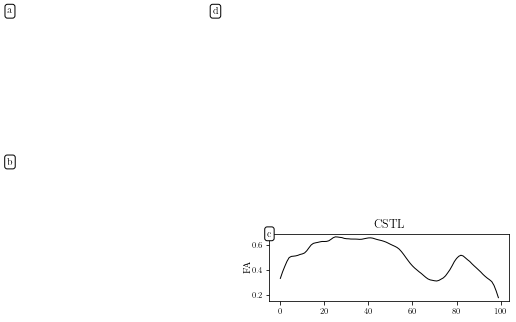

In [42]:
fig = plt.figure(constrained_layout=True, figsize=set_size(width=FULL_TEXT_WIDTH, subplots=(4, 4)))

gs = GridSpec(4, 20, figure=fig, wspace=0.1)

ax0 = fig.add_subplot(gs[0:2, 0:9])
ax1 = fig.add_subplot(gs[2:, 0:9])
ax2 = fig.add_subplot(gs[-1, 9:])
ax3 = fig.add_subplot(gs[:3, 9:])

    
### Remove axes for the tractogram and grouped covariates subfigures
_ = ax0.axis('off')
_ = ax1.axis('off')
_ = ax3.axis('off')

### Plot a tract profile
df_stat = tract_stats[tract_names[0]]
title = tract_names[0]

sid = 5
sub = false_pos_subs[sid]
_ = ax2.plot(
    sub["nodeID"], sub["fa"],
    linewidth=1,
    color="black"
)

_ = ax2.set_xlabel("% distance along fiber bundle")
_ = ax2.set_ylabel("FA", labelpad=-0.1)
_ = ax2.set_title("CSTL")

for ax, alpha in zip([ax0, ax1, ax2], "abc"):
    ax.text(  # position text relative to Axes
        0.0, 1.0, alpha,
        ha="center", va="center",
        transform=ax.transAxes,
        fontweight="bold",
        bbox=dict(
            facecolor="white",
            edgecolor="black",
            boxstyle="round,pad=0.25"
        )
    )

ax3.text(  # position text relative to Axes
    -0.225, 1.0, "d",
    ha="center", va="center",
    transform=ax3.transAxes,
    fontweight="bold",
    bbox=dict(
        facecolor="white",
        edgecolor="black",
        boxstyle="round,pad=0.25"
    )
)

fig.savefig(op.join(fig_dir, "method-quad.pdf"),
            bbox_inches="tight")

# Age regression on Yeatman data

In [43]:
age_bagging_results = age_results["bagging_target_transform_clone_estimators"][0]
    
X, y, groups, columns, subjects, classes = afqi.load_afq_data(
    "../data/raw/age_data",
    target_cols=["Age"],
)
label_sets = afqi.multicol2sets(pd.MultiIndex.from_tuples(columns, names=["metric", "tractID", "nodeID"]))
pyafq_bundles = [
    c for c in columns
    if c[1] not in ["Right Cingulum Hippocampus", "Left Cingulum Hippocampus"]
]
pyafq_bundles = [
    [c] for c in np.unique([col[1] for col in pyafq_bundles])
]
X_pyafq_bundles = afqi.select_groups(
    X,
    pyafq_bundles,
    label_sets
)

columns_pyafq = [
    c for c in columns 
    if c[1] not in ["Right Cingulum Hippocampus", "Left Cingulum Hippocampus"]
]
label_sets = afqi.multicol2sets(pd.MultiIndex.from_tuples(columns_pyafq, names=["metric", "tractID", "nodeID"]))

X_md_fa = afqi.select_groups(
    X_pyafq_bundles,
    [["fa"], ["md"]],
    label_sets
)

columns_md_fa = [
    c for c in columns
    if "fa" in c or "md" in c
]
groups_md_fa = groups[:36]

INFO:AFQ.viz:Loading Volume...


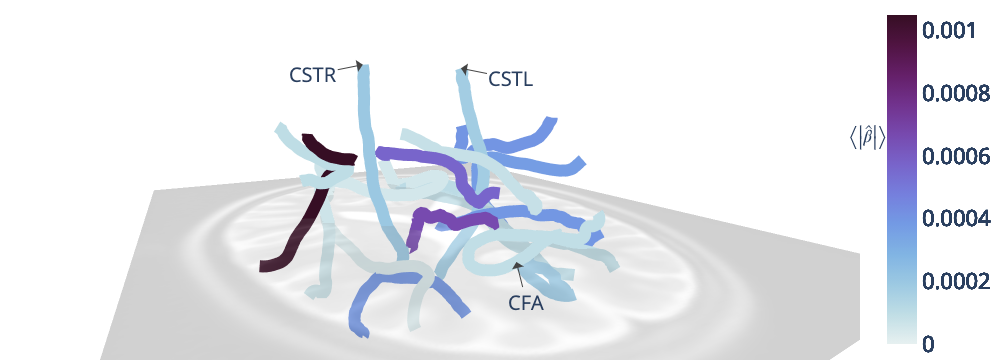

In [44]:
_beta_hats, _fig = plot_coefs_on_bundle_cores(
    age_results,
    key="bagging_target_transform_clone_estimators",
    columns=columns_md_fa,
    linewidth=24,
    metric="md",
    coef_func=("abs_mean",),
    eye=dict(x=0.475, y=0.855, z=0.19),
    center=dict(x=0, y=0, z=0),
    width=500, height=320,
)

beta_hats["wh"] = _beta_hats
plotly_figs["wh"] = _fig

_fig.show()

In [45]:
coefs_img_fname = op.join(fig_dir, "wh_coefs.pdf")
_fig.write_image(coefs_img_fname)
coefs_img_fname = op.join(fig_dir, "wh_coefs.png")
_fig.write_image(coefs_img_fname, scale=2)

In [46]:
df_bag["wh"] = pd.concat([
    pd.DataFrame.from_dict(
        {
            k: v for k, v in bag_res.items()
            if k in ["test_idx", "y_pred", "y_true"]
        }
    ).set_index(keys="test_idx", drop=True)
    for bag_res in age_bagging_results.values()
]).sort_index()

df_bag["wh"]["residual"] = df_bag["wh"]["y_true"] - df_bag["wh"]["y_pred"]
df_bag["wh"]["std_residual"] = df_bag["wh"]["residual"] / np.std(df_bag["wh"]["residual"])

# HBN age regression

In [47]:
hbn_bagging_results = hbn_results["bagging_target_transform_trim0"][0]

X, y, groups, columns, subjects, classes = afqi.load_afq_data(
    "../data/raw/hbn_data",
    target_cols=["Age"],
    index_col="EID"
)

df_y = pd.read_csv("../data/raw/hbn_data/subjects.csv").drop(axis="rows", index=0)
df_y = df_y[["EID", "Age"]]
df_y = df_y.set_index("EID", drop=True)
df_subs = pd.DataFrame(index=subjects)
df_subs = df_subs.merge(df_y, how="left", left_index=True, right_index=True)
y = df_subs["Age"].astype(np.float64).values
nan_mask = np.logical_not(np.isnan(y))
y = y[nan_mask]
X = X[nan_mask, :]

INFO:AFQ.viz:Loading Volume...


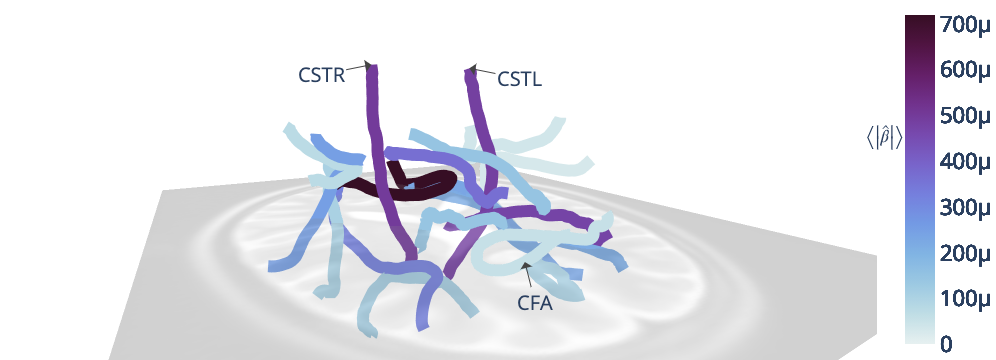

In [48]:
_beta_hats, _fig = plot_coefs_on_bundle_cores(
    hbn_results,
    key="bagging_target_transform_trim0",
    columns=columns,
    linewidth=24,
    coef_func=("abs_mean",),    
    eye=dict(x=0.475, y=0.855, z=0.19),
    center=dict(x=0, y=0, z=0),
    width=500, height=320,
    metric="dki_md",
    use_pyafq_bundle_names=True,
)

beta_hats["hbn"] = _beta_hats
plotly_figs["hbn"] = _fig

_fig.show()

In [49]:
coefs_img_fname = op.join(fig_dir, "hbn_coefs.pdf")
_fig.write_image(coefs_img_fname)
coefs_img_fname = op.join(fig_dir, "hbn_coefs.png")
_fig.write_image(coefs_img_fname, scale=2)

In [50]:
df_bag["hbn"] = pd.concat([
    pd.DataFrame.from_dict(
        {
            k: v for k, v in bag_res.items()
            if k in ["test_idx", "y_pred", "y_true"]
        }
    ).set_index(keys="test_idx", drop=True)
    for bag_res in hbn_bagging_results.values()
]).sort_index()

df_bag["hbn"]["residual"] = df_bag["hbn"]["y_true"] - df_bag["hbn"]["y_pred"]
df_bag["hbn"]["std_residual"] = df_bag["hbn"]["residual"] / np.std(df_bag["hbn"]["residual"])

# Cam-CAN regression

In [51]:
cc_bagging_results = cc_results["bagging_trim0"][0]

df_bag["camcan"] = pd.concat([
    pd.DataFrame.from_dict(
        {
            k: v for k, v in bag_res.items()
            if k in ["test_idx", "y_pred", "y_true"]
        }
    ).set_index(keys="test_idx", drop=True)
    for bag_res in cc_bagging_results.values()
]).sort_index()

df_bag["camcan"]["residual"] = df_bag["camcan"]["y_true"] - df_bag["camcan"]["y_pred"]
df_bag["camcan"]["std_residual"] = df_bag["camcan"]["residual"] / np.std(df_bag["camcan"]["residual"])

INFO:AFQ.viz:Loading Volume...


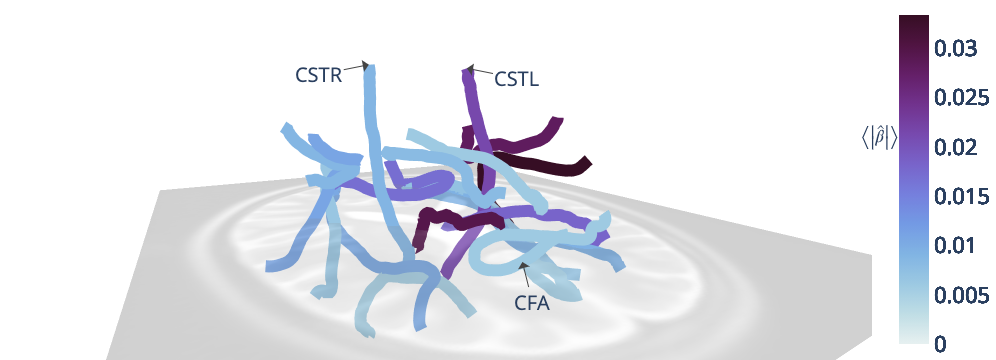

In [52]:
_beta_hats, _fig = plot_coefs_on_bundle_cores(
    cc_results,
    key="bagging_trim0",
    columns=columns,
    linewidth=24,
    coef_func=("abs_mean",),
    eye=dict(x=0.475, y=0.855, z=0.19),
    center=dict(x=0, y=0, z=0),
    width=500, height=320,
    metric="dki_md",
    use_pyafq_bundle_names=True,
)

beta_hats["camcan"] = _beta_hats
plotly_figs["camcan"] = _fig

_fig.show()

In [53]:
coefs_img_fname = op.join(fig_dir, "camcan_coefs.pdf")
_fig.write_image(coefs_img_fname)
coefs_img_fname = op.join(fig_dir, "camcan_coefs.png")
_fig.write_image(coefs_img_fname, scale=2)

In [54]:
for key in ["wh", "hbn", "camcan"]:
    r2 = r2_score(df_bag[key]["y_true"], df_bag[key]["y_pred"])
    mae = median_absolute_error(df_bag[key]["y_true"], df_bag[key]["y_pred"])
    print("{0:6s}: R^2 = {1:5.3f}".format(
        key, r2
    ))
    
    with open(latex_output_file, "a") as fp:
        fp.write(latex_number_template.substitute(KEY=key + "Rsq", VALUE=round(r2, 2)))
        fp.write(latex_number_template.substitute(KEY=key + "Mae", VALUE=round(mae, 2)))

wh    : R^2 = 0.517
hbn   : R^2 = 0.561
camcan: R^2 = 0.770


In [55]:
absmean_bundles = {}
for dataset, metric in zip(["wh", "hbn", "camcan"], ["md", "dki_md", "dki_md"]):
    absmean_bundles[dataset] = sorted([
        (bundle_id, np.mean(np.abs(bundle[metric]))) for bundle_id, bundle in beta_hats[dataset].items()
    ], key=lambda t: t[1], reverse=True)[0]
    
absmean_bundles

{'wh': ('Right Arcuate', 0.001046374379489092),
 'hbn': ('FP', 0.0007182363606984409),
 'camcan': ('ARC_L', 0.03331236121092687)}

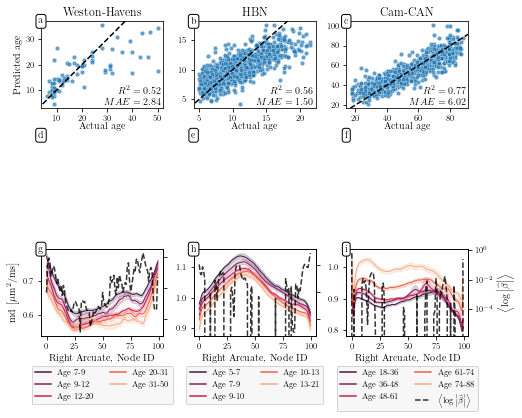

In [56]:
fig, axes = plt.subplots(3, 3, figsize=set_size(width=FULL_TEXT_WIDTH, subplots=(3.75, 3)))

df_scatter = {key: df for key, df in df_bag.items() if key != "sarica"}
titles = {
    "hbn": "HBN",
    "camcan": "Cam-CAN",
    "wh": "Weston-Havens",
}

for ax, (key, df) in zip(axes[0], df_scatter.items()):
    sns.scatterplot(x="y_true", y="y_pred", data=df, ax=ax, s=20, alpha=0.7)

    _ = ax.set_xlabel("Actual age", labelpad=-0.3)
    _ = ax.autoscale(False)
    _ = ax.plot([0, 200], [0, 200], color="black", ls="--", marker="")
    _ = ax.text(
        0.98, 0.02,
        "\n".join([
            r"$R^2={0:4.2f}$".format(r2_score(df["y_true"], df["y_pred"])),
            r"$MAE={0:4.2f}$".format(median_absolute_error(df["y_true"], df["y_pred"]))
        ]),
        ha="right", va="bottom",
        transform=ax.transAxes,
        fontweight="bold",
    )
    _ = ax.set_title(titles[key])
    _ = ax.tick_params(axis='both', which='major')
    _ = ax.tick_params(axis='both', which='minor')
    
_ = axes[0, 0].set_ylabel("Predicted age")
_ = axes[0, 1].set_ylabel(None)
_ = axes[0, 2].set_ylabel(None)

for ax in axes[1]:
    _ = ax.axis("off")

cmap_seq = "rocket"

twin_axes = {}
global_ymin = np.inf
global_ymax = -np.inf

for data_key, data_dir, metric, target, subject_id_column, tid, ax in zip(
    ["wh", "hbn", "camcan"],
    ["../data/raw/age_data", "../data/raw/hbn_data", "../data/raw/cam-can_data"],
    ["md", "dki_md", "dki_md"],
    ["Age", "Age", "age"],
    ["subjectID", "EID", "Observations"],
    ["Right Arcuate", "ARC_R", "ARC_R"],
    axes[2],
):
    subjects = pd.read_csv(op.join(data_dir, "subjects.csv"))
    nodes = pd.read_csv(op.join(data_dir, "nodes.csv"))
    merged = pd.merge(nodes, subjects,
                      left_on="subjectID", 
                      right_on=subject_id_column).set_index("subjectID")
    stats = nodes.columns.drop(["subjectID", "tractID", "nodeID"])
    stat = merged[["nodeID", "tractID", metric, target]]    

    trim_nodes = 0

    tract_stats = stat[stat["tractID"] == tid].drop("tractID", axis="columns").dropna()
    tract_stats[target + " Quintile"], qbins = pd.qcut(tract_stats[target].astype(np.float64), 5, retbins=True)

    tract_stats = tract_stats[
        (tract_stats["nodeID"] >= trim_nodes) & (tract_stats["nodeID"] < (100 - trim_nodes))
    ]

    node_idx = np.sort(pd.unique(tract_stats["nodeID"]))
    bgcolor = "white"
    bundle_id = afqd.BUNDLE_MAT_2_PYTHON.get(tid, tid)

    if metric == "dki_md":
        tract_stats[metric] *= 1000.0

    _ = sns.lineplot(
        x="nodeID", y=metric, hue=target + " Quintile",
        data=tract_stats,
        ci=68.2, palette=cmap_seq,
        ax=ax,
        linewidth=1.0,
    )

    if data_key == "wh":
        _ = ax.set_ylabel(
            r"{} $\left[ \mu \textrm{{m}}^2 / \textrm{{ms}} \right]$".format(
                metric.lower().replace("_", " ")
            )
        )
    else:
        _ = ax.set_ylabel("")
        
    _ = ax.set_xlabel("Right Arcuate, Node ID")

    _ = ax.tick_params(axis='both', which='major')
    _ = ax.set_facecolor(bgcolor)
    _ = ax.get_legend().remove()

    box = ax.get_position()
    _ = ax.set_position([box.x0, box.y0 + box.height * 0.1,
                     box.width, box.height * 0.9])

    twin_axes[data_key] = ax.twinx()
    beta_line = twin_axes[data_key].semilogy(
        node_idx,
        np.abs(beta_hats[data_key][tid][metric]),
        linestyle="--", color="black", linewidth=1.5, alpha=0.8,
    )

    if data_key == "camcan":
        _ = twin_axes[data_key].set_ylabel(
            r"$\left\langle \log \left| \widehat{\beta} \right| \right\rangle$"
        )
    else:
        _ = twin_axes[data_key].set_yticklabels([])

    _ = twin_axes[data_key].tick_params(axis='both', which='major')

    _tmp_ymin, _tmp_ymax = twin_axes[data_key].get_ylim()
    if _tmp_ymin < global_ymin:
        global_ymin = _tmp_ymin
    if _tmp_ymax > global_ymax:
        global_ymax = _tmp_ymax

#     _ = ax.set_title(bundle_id.replace("_", "\_"))

    handles, labels = ax.get_legend_handles_labels()
    labels = [f"Age {int(qb[0]):d}-{int(qb[1]):d}" for qb in zip(qbins[:-1], qbins[1:])]

    if data_key == "camcan":
        handles = handles + beta_line
        labels += [r"$\left\langle \log \left| \widehat{\beta} \right| \right\rangle$"]

#     _ = fig.subplots_adjust(bottom=0.18, wspace=0.275)

    leg = ax.legend(
        handles, labels,
        facecolor="whitesmoke",
        bbox_to_anchor=(0.5, -0.3),
        loc="upper center",
        ncol=2
    )

# set the linewidth of each legend object
# for legobj in leg.legendHandles:
#     _ = legobj.set_linewidth(3.0)

for dkey, ax in twin_axes.items():
    if dkey != data_key:
        twin_axes[data_key].get_shared_y_axes().join(
            twin_axes[data_key], ax
        )

for ax, alpha in zip(axes[0:2].flatten(), "abcdef"):
    ax.text(  # position text relative to Axes
        0.0, 1.0, alpha,
        ha="center", va="center",
        transform=ax.transAxes,
        fontweight="bold",
        bbox=dict(
            facecolor="white",
            edgecolor="black",
            boxstyle="round,pad=0.25"
        ),
    )
    
for ax, alpha in zip(twin_axes.values(), "ghi"):
#     _ = ax.set_xlabel("% distance along fiber bundle")
    _ = ax.text(  # position text relative to Axes
        0.0, 1.0, alpha,
        ha="center", va="center",
        transform=ax.transAxes,
        fontweight="bold",
        bbox=dict(
            facecolor="white",
            edgecolor="black",
            boxstyle="round,pad=0.25"
        ),
    )

fig.tight_layout(pad=0, h_pad=0, w_pad=0)
fig.savefig(op.join(fig_dir, "regression_scatter.pdf"), bbox_inches="tight")

In [57]:
def plot_tract_profiles_and_coefs(data_dir, beta_hats, target,
                                  metrics=("fa", "md"), quintiles=True,
                                  subject_id_column="subjectID",
                                  ymin=None, ymax=None,
                                  trim_nodes=0, cmap_seq="crest",
                                  plot_log_beta=False):
    figs = {}
    twin_axes = {}
    
    global_ymin = np.inf
    global_ymax = -np.inf
    
    for metric in metrics:
        subjects = pd.read_csv(op.join(data_dir, "subjects.csv"))
        nodes = pd.read_csv(op.join(data_dir, "nodes.csv"))
        merged = pd.merge(nodes, subjects,
                          left_on="subjectID", 
                          right_on=subject_id_column).set_index("subjectID")
        stats = nodes.columns.drop(["subjectID", "tractID", "nodeID"])
        stat = merged[["nodeID", "tractID", metric, target]]    

        tract_names = pd.unique(stat["tractID"])

        tract_stats = {}
        node_idx = {}
        for tid in tract_names:
            tract_stats[tid] = stat[stat["tractID"] == tid].drop("tractID", axis="columns").dropna()
            if quintiles:
                tract_stats[tid][target + " Quintile"], qbins = pd.qcut(tract_stats[tid][target].astype(np.float64), 5, retbins=True)
            
            tract_stats[tid] = tract_stats[tid][
                (tract_stats[tid]["nodeID"] >= trim_nodes) & (tract_stats[tid]["nodeID"] < (100 - trim_nodes))
            ]
            
            node_idx[tid] = np.sort(pd.unique(tract_stats[tid]["nodeID"]))

        bgcolor = "white"
        positions = plot_utils.POSITIONS.copy()
        positions["FA"] = (0, 0)
        positions["FP"] = (0, 3)
        for bid in positions.keys():
            if bid.endswith("_R"):
                old_position = positions[bid]
                positions[bid] = (old_position[0], old_position[1] - 1)

        fig, axes = plt.subplots(
            nrows=5, ncols=4,
            figsize=set_size(width=FULL_TEXT_LENGTH, subplots=(5, 4)),
            sharex=True
        )

        twin_axes[metric] = {}

        for tid, df_stat in tract_stats.items():
            bundle_id = afqd.BUNDLE_MAT_2_PYTHON.get(tid, tid)
            
            if "HCC_" in bundle_id or "Cingulum Hippocampus" in tid:
                continue
            
            ax = axes[positions[bundle_id][0],
                      positions[bundle_id][1]]
            
            if metric == "dki_md":
                df_stat[metric] *= 1000.0
                
            if quintiles:
                _ = sns.lineplot(
                    x="nodeID", y=metric, hue=target + " Quintile",
                    data=df_stat,
                    ci=68.2, palette=cmap_seq,
                    ax=ax,
                    linewidth=1.0
                )
            else:
                _ = sns.lineplot(
                    x="nodeID", y=metric, hue=target,
                    data=df_stat,
                    ci=68.2, palette=cmap_seq,
                    ax=ax,
                    linewidth=1.0
                )

            if positions[bundle_id][0] == 4:
                _ = ax.set_xlabel("% distance along fiber bundle")

            if (positions[bundle_id][1] == 0
                or (positions[bundle_id][1] == 1 and positions[bundle_id][0] == 4)):
                if metric in ["md", "dki_md"]:
                    _ = ax.set_ylabel(
                        r"{} $\left[ \mu \textrm{{m}}^2 / \textrm{{ms}} \right]$".format(
                            metric.lower().replace("_", " ")
                        )
                    )
                else:
                    _ = ax.set_ylabel(metric.lower().replace("_", " "))
            else:
                _ = ax.set(ylabel=None)


            _ = ax.tick_params(axis='both', which='major')
            _ = ax.set_facecolor(bgcolor)
            _ = ax.get_legend().remove()

            box = ax.get_position()
            _ = ax.set_position([box.x0, box.y0 + box.height * 0.1,
                             box.width, box.height * 0.9])

            twin_axes[metric][bundle_id] = ax.twinx()
            if plot_log_beta:
                beta_line = twin_axes[metric][bundle_id].semilogy(
                    node_idx[tid],
                    np.abs(beta_hats[tid][metric][slice(np.min(node_idx[tid]), np.max(node_idx[tid]) + 1)]),
                    linestyle="--", color="black", linewidth=1.5, alpha=0.8,
                )
            else:
                beta_line = twin_axes[metric][bundle_id].plot(
                    node_idx[tid],
                    beta_hats[tid][metric][slice(np.min(node_idx[tid]), np.max(node_idx[tid]) + 1)],
                    linestyle="--", color="black", linewidth=1.5, alpha=0.8,
                )

            if positions[bundle_id][1] == 3:
                if plot_log_beta:
                    _ = twin_axes[metric][bundle_id].set_ylabel(
                        r"$\left\langle \log \left| \widehat{\beta} \right| \right\rangle$"
                    )
                else:
                    _ = twin_axes[metric][bundle_id].set_ylabel(
                        r"$\left\langle \widehat{\beta} \right\rangle$"
                    )
            else:
                _ = twin_axes[metric][bundle_id].set_yticklabels([])

            _ = twin_axes[metric][bundle_id].tick_params(axis='both', which='major')
            _tmp_ymin, _tmp_ymax = twin_axes[metric][bundle_id].get_ylim()
            if _tmp_ymin < global_ymin:
                global_ymin = _tmp_ymin
            if _tmp_ymax > global_ymax:
                global_ymax = _tmp_ymax
                                
            _ = ax.set_title(bundle_id.replace("_", "").replace("FA", "CFA").replace("FP", "CFP"))

        _ = axes[4, 0].axis("off")
        _ = axes[4, 3].axis("off")
        
        handles, labels = ax.get_legend_handles_labels()
        handles = handles + beta_line
        if quintiles:
            labels = [f"{target} {int(qb[0]):d}-{int(qb[1]):d}" for qb in zip(qbins[:-1], qbins[1:])]
            
        if plot_log_beta:
            labels += [r"$\left\langle \log \left| \widehat{\beta} \right| \right\rangle$"]
        else:
            labels += [r"$\left\langle \widehat{\beta} \right\rangle$"]

        _ = fig.subplots_adjust(bottom=0.18, wspace=0.275)

        for bid, ax in twin_axes[metric].items():
            if bid != bundle_id:
                twin_axes[metric][bundle_id].get_shared_y_axes().join(
                    twin_axes[metric][bundle_id], ax
                )

        leg = plt.figlegend(
            handles, labels,
            facecolor="whitesmoke",
            bbox_to_anchor=(0.5, 0.02),
            loc="upper center",
            ncol=6
        )

        # set the linewidth of each legend object
        for legobj in leg.legendHandles:
            _ = legobj.set_linewidth(3.0)

        fig.tight_layout(h_pad=0.5, w_pad=-0.5)

        figs[metric] = fig
        
    for metric in metrics:
        for bid, ax in twin_axes[metric].items():
            if any([ymin is not None, ymax is not None]):
                _ = ax.set_ylim(ymin, ymax)
            else:
                _ = ax.set_ylim(global_ymin, global_ymax)

    return figs

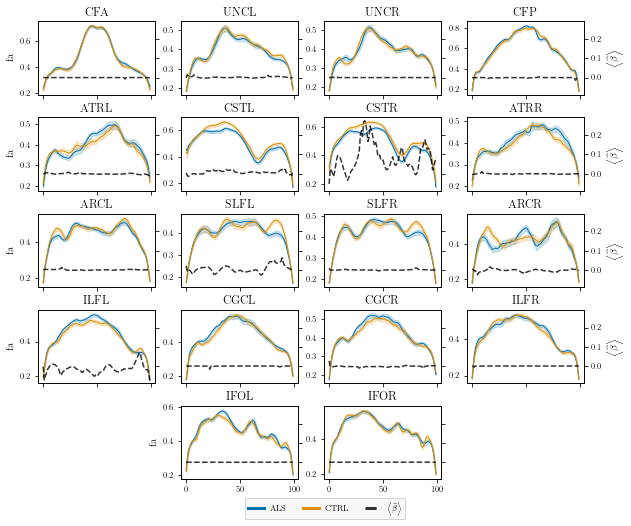

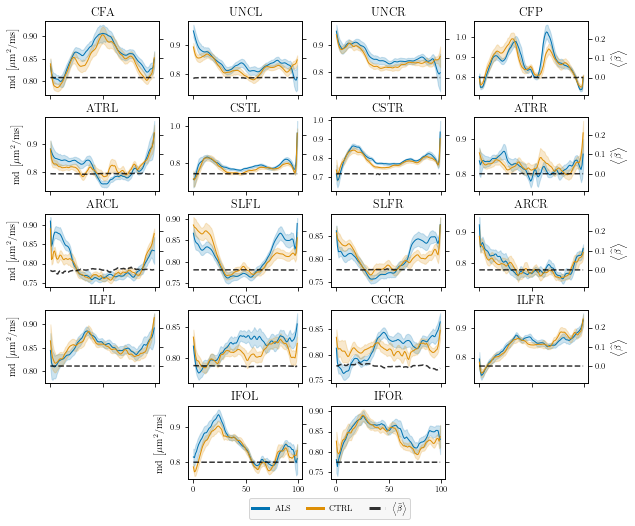

In [58]:
ba_sarica = plot_tract_profiles_and_coefs(
    data_dir="../data/raw/als_data",
    beta_hats=beta_hats["sarica"],
    target="class",
    metrics=("fa", "md"),
    quintiles=False,
    cmap_seq="colorblind",
    plot_log_beta=False,
    trim_nodes=0,
)

ba_sarica["fa"].savefig(op.join(fig_dir, "sarica_coefs_profiles_fa.pdf"), bbox_inches="tight")
ba_sarica["md"].savefig(op.join(fig_dir, "sarica_coefs_profiles_md.pdf"), bbox_inches="tight")

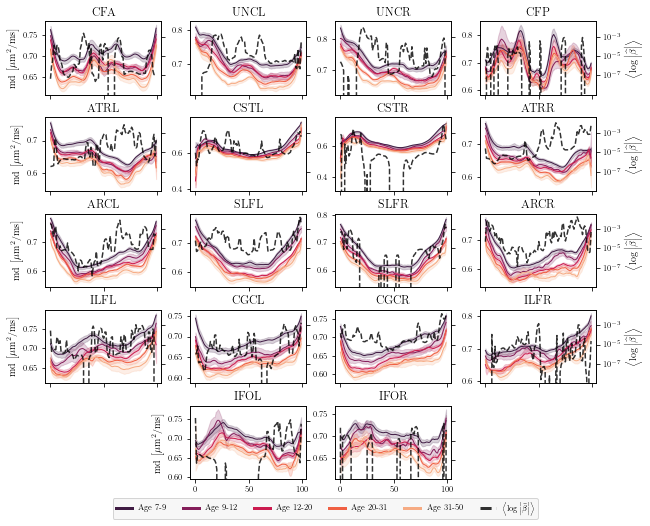

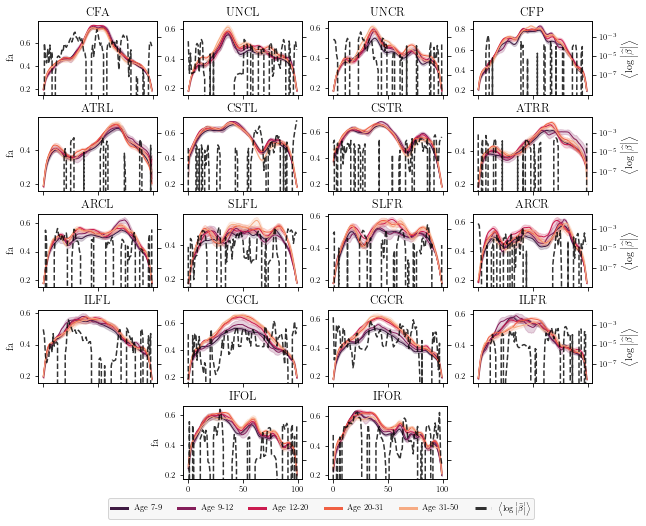

In [59]:
ba_wh = plot_tract_profiles_and_coefs(
    data_dir="../data/raw/age_data",
    beta_hats=beta_hats["wh"],
    target="Age",
    metrics=("md", "fa"),
    quintiles=True,
    cmap_seq="rocket",
    plot_log_beta=True,
    trim_nodes=0
)

ba_wh["md"].savefig(op.join(fig_dir, "wh_coefs_profiles_md.pdf"), bbox_inches="tight")
ba_wh["fa"].savefig(op.join(fig_dir, "wh_coefs_profiles_fa.pdf"), bbox_inches="tight")

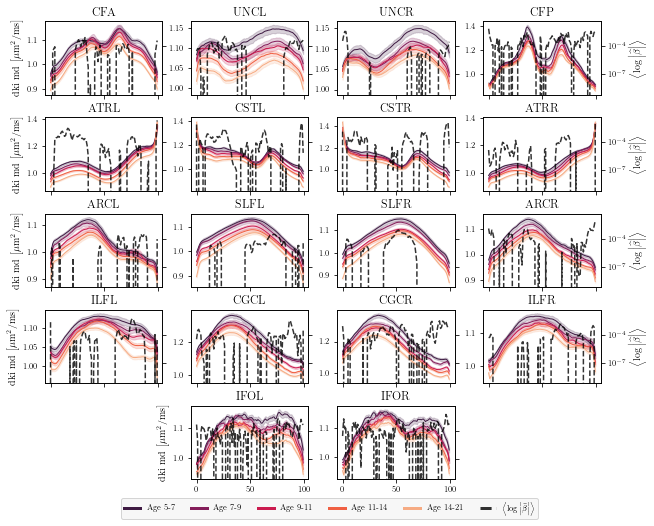

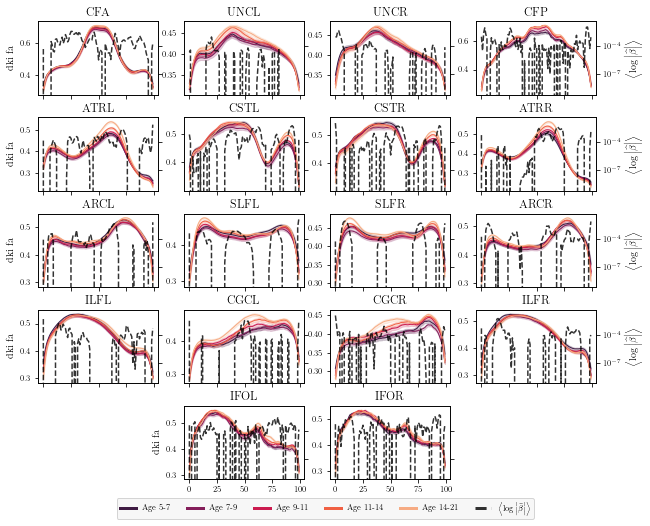

In [60]:
ba_hbn = plot_tract_profiles_and_coefs(
    data_dir="../data/raw/hbn_data",
    beta_hats=beta_hats["hbn"],
    target="Age",
    metrics=["dki_md", "dki_fa"],
    quintiles=True,
    subject_id_column="EID",
    cmap_seq="rocket",
    plot_log_beta=True,
    trim_nodes=0
)

ba_hbn["dki_md"].savefig(op.join(fig_dir, "hbn_coefs_profiles_md.pdf"), bbox_inches="tight")
ba_hbn["dki_fa"].savefig(op.join(fig_dir, "hbn_coefs_profiles_fa.pdf"), bbox_inches="tight")

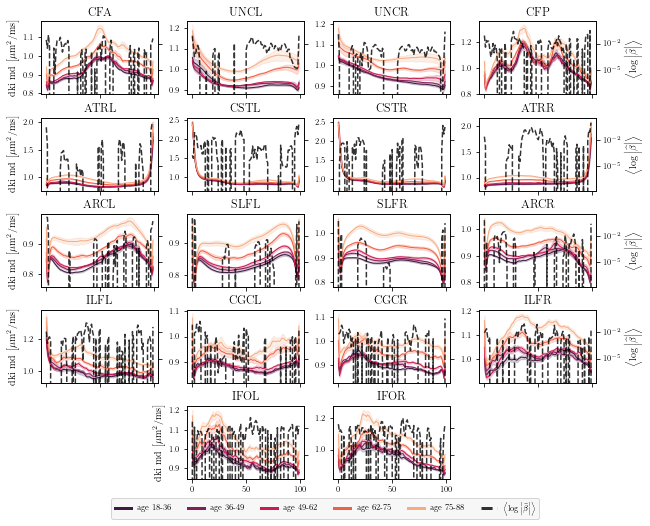

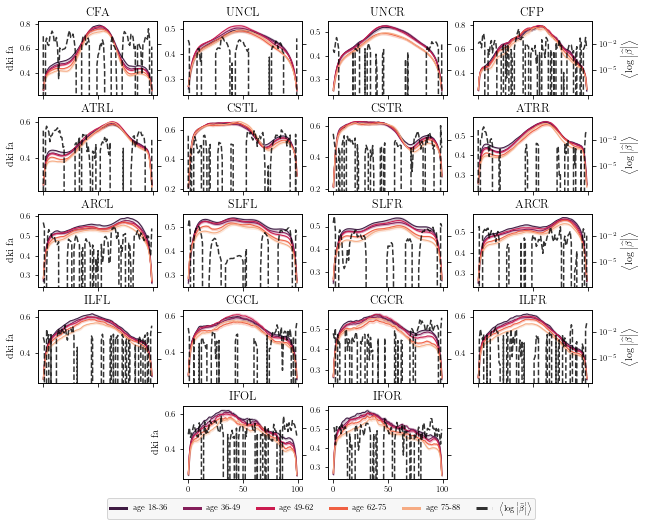

In [61]:
ba_cc = plot_tract_profiles_and_coefs(
    data_dir="../data/raw/cam-can_data",
    beta_hats=beta_hats["camcan"],
    target="age",
    metrics=["dki_md", "dki_fa"],
    quintiles=True,
    subject_id_column="Observations",
    cmap_seq="rocket",
    plot_log_beta=True,
    trim_nodes=0,
)

ba_cc["dki_md"].savefig(op.join(fig_dir, "cc_coefs_profiles_md.pdf"), bbox_inches="tight")
ba_cc["dki_fa"].savefig(op.join(fig_dir, "cc_coefs_profiles_fa.pdf"), bbox_inches="tight")